In [1]:
import os
import sys

# to setup import paths add project root dirs to sys.path
sys.path.append(os.path.join(os.getcwd(), "..", ".."))
from baseVR.base_functionality import init_import_paths
init_import_paths()


In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib qt
# %matplotlib widget

from analytics_processing import analytics
import analytics_processing.analytics_constants as C
from CustomLogger import CustomLogger as Logger

from dashsrc.plot_components.plot_wrappers.data_selection import group_filter_data

from analytics_processing.modality_loading import session_modality_from_nas
from analytics_processing.sessions_from_nas_parsing import sessionlist_fullfnames_from_args
from analytics_processing.sessions_from_nas_parsing import fullfnames2snames


In [3]:
output_dir = "/mnt/SpatialSequenceLearning/Simon/singleTrials"
data = {}
nas_dir = C.device_paths()[0]
Logger().init_logger(None, None, logging_level="INFO")


In [4]:
animal_ids = [6]
paradigm_ids = [1100]
session_ids = None

In [5]:
session_dirs = sessionlist_fullfnames_from_args(paradigm_ids, animal_ids, session_ids)[0]
session_names = fullfnames2snames(session_dirs)

In [6]:
framew_beh = analytics.get_analytics('BehaviorFramewise', session_names=session_names[:],)
framew_beh

/home/vrmaster/Projects/VirtualReality/analysisVR/analytics_processing/analytics.py:606: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  aggr = pd.concat(aggr)
2026-01-29 10:36:22,526|INFO|447304|analytics|get_analytics
	Returning BehaviorFramewise for 34 sessions.


frame_id  frame_pc_timestamp  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0            14109    1731592882746345   
                                       1            14110    1731592882763007   
                                       2            14111    1731592882779674   
                                       3            14112    1731592882797859   
                                       4            14113    1731592882814538   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636      287569    1737986032936566   
                                       265637      287570    1737986032953237   
                                       265638      287571    1737986032969901   
                                       265639      287572    1737986032986570   
                                       265640      287573    1737986033003237   

                                                 frame_position  \
paradigm_id animal_id session_id       entry_id                   
1100        6         2024-11-14_15-01 0                 0.0000   
                                       1                 0.0000   
                                       2                 0.0000   
                                       3                 0.0000   
                                       4                 0.0000   
...                                                         ...   
                      2025-01-27_13-39 265636         -166.7919   
                                       265637         -166.7178   
                                       265638         -166.6485   
                                       265639         -166.5945   
                                       265640         -166.5251   

                                                 frame_ephys_timestamp  \
paradigm_id animal_id session_id       entry_id                          
1100        6         2024-11-14_15-01 0                           NaN   
                                       1                           NaN   
                                       2                           NaN   
                                       3                           NaN   
                                       4                           NaN   
...                                                                ...   
                      2025-01-27_13-39 265636             4.435022e+09   
                                       265637             4.435039e+09   
                                       265638             4.435056e+09   
                                       265639             4.435072e+09   
                                       265640             4.435089e+09   

                                                 trial_id frame_ephys_patched  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0             -1.0                None   
                                       1             -1.0                None   
                                       2             -1.0                None   
                                       3             -1.0                None   
                                       4             -1.0                None   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636        -1.0                   0   
                                       265637        -1.0                   0   
                                       265638        -1.0                   0   
                                       265639        -1.0                   0   
                                       265640        -1.0                   0   

                                                       fps  \
paradigm_id animal_id session_id       entry

In [ ]:
s_id = '2024-12-11_17-42' #17
trial_id = 34
# time_col = 'frame_pc_timestamp'
time_col = 'frame_ephys_timestamp'

trial_data = framew_beh.xs(s_id, level='session_id').loc[framew_beh.xs(s_id, level='session_id')['trial_id'] == trial_id]
trial_data = trial_data.set_index(time_col, drop=True, append=False)
trial_data.index = (trial_data.index - trial_data.index[0]) /1e6
trial_data

(1030, 97)

In [21]:
framew_beh

frame_id  frame_pc_timestamp  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0            14109    1731592882746345   
                                       1            14110    1731592882763007   
                                       2            14111    1731592882779674   
                                       3            14112    1731592882797859   
                                       4            14113    1731592882814538   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636      287569    1737986032936566   
                                       265637      287570    1737986032953237   
                                       265638      287571    1737986032969901   
                                       265639      287572    1737986032986570   
                                       265640      287573    1737986033003237   

                                                 frame_position  \
paradigm_id animal_id session_id       entry_id                   
1100        6         2024-11-14_15-01 0                 0.0000   
                                       1                 0.0000   
                                       2                 0.0000   
                                       3                 0.0000   
                                       4                 0.0000   
...                                                         ...   
                      2025-01-27_13-39 265636         -166.7919   
                                       265637         -166.7178   
                                       265638         -166.6485   
                                       265639         -166.5945   
                                       265640         -166.5251   

                                                 frame_ephys_timestamp  \
paradigm_id animal_id session_id       entry_id                          
1100        6         2024-11-14_15-01 0                           NaN   
                                       1                           NaN   
                                       2                           NaN   
                                       3                           NaN   
                                       4                           NaN   
...                                                                ...   
                      2025-01-27_13-39 265636             4.435022e+09   
                                       265637             4.435039e+09   
                                       265638             4.435056e+09   
                                       265639             4.435072e+09   
                                       265640             4.435089e+09   

                                                 trial_id frame_ephys_patched  \
paradigm_id animal_id session_id       entry_id                                 
1100        6         2024-11-14_15-01 0             -1.0                None   
                                       1             -1.0                None   
                                       2             -1.0                None   
                                       3             -1.0                None   
                                       4             -1.0                None   
...                                                   ...                 ...   
                      2025-01-27_13-39 265636        -1.0                   0   
                                       265637        -1.0                   0   
                                       265638        -1.0                   0   
                                       265639        -1.0                   0   
                                       265640        -1.0                   0   

                                                       fps  \
paradigm_id animal_id session_id       entry

(1587, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [8.002], in R1: True, in R2: False


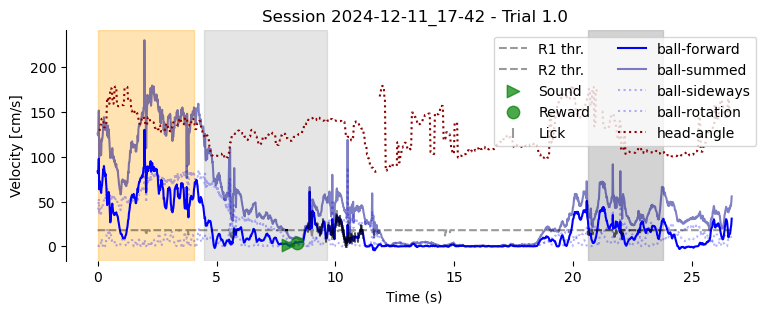

(1398, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [19.53455 20.3013 ], in R1: False, in R2: True
  Diff to R2 thr: -0.11664999999999992


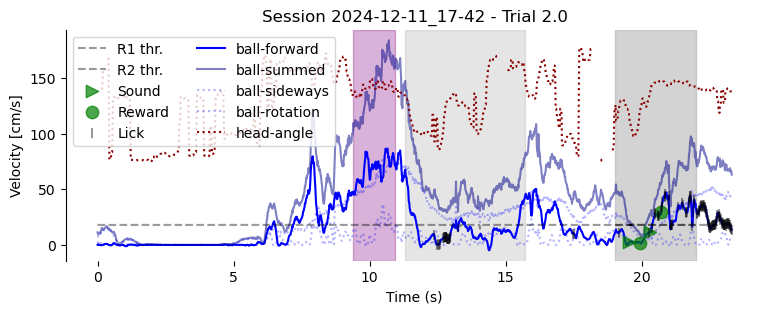

(1917, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [30.03295], in R1: False, in R2: True
  Diff to R2 thr: -0.06664999999999921


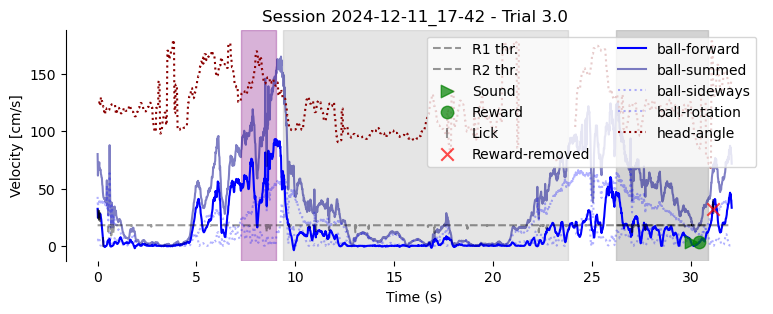

(1029, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [13.9802 14.7135], in R1: False, in R2: True
  Diff to R2 thr: -0.09999999999999964


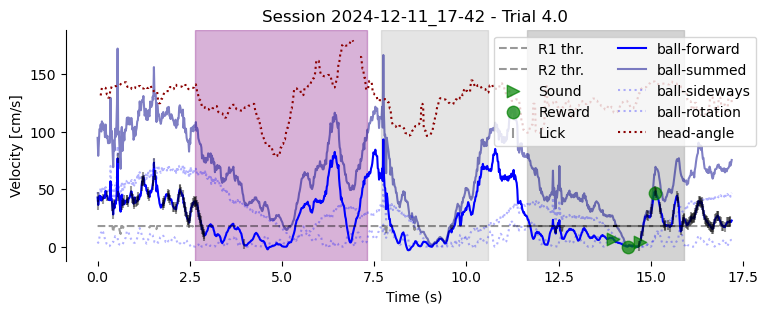

(1929, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [13.78285], in R1: False, in R2: False


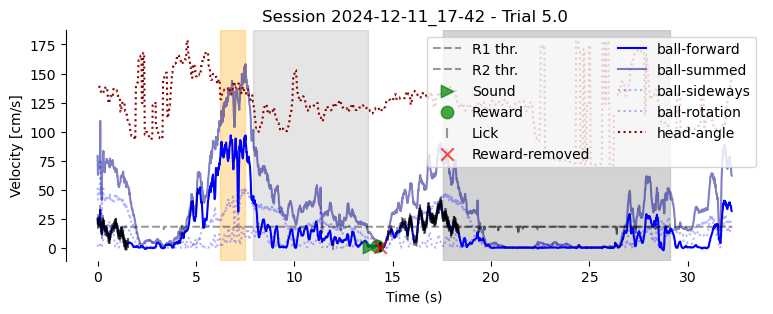

(1345, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [8.01735 8.7549 ], in R1: True, in R2: False


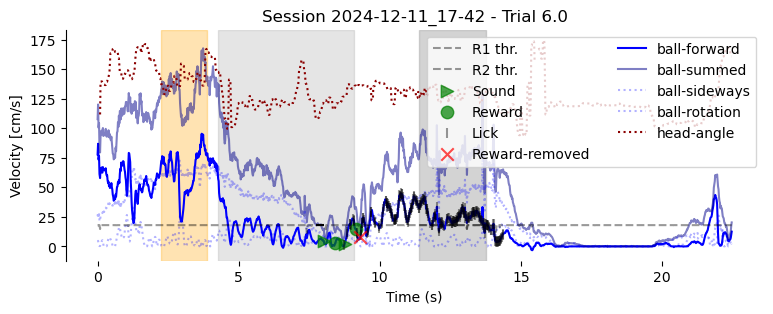

(1610, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [7.50225], in R1: True, in R2: False


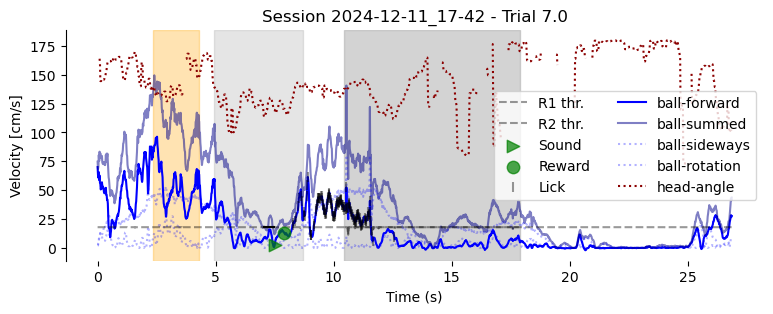

(1423, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



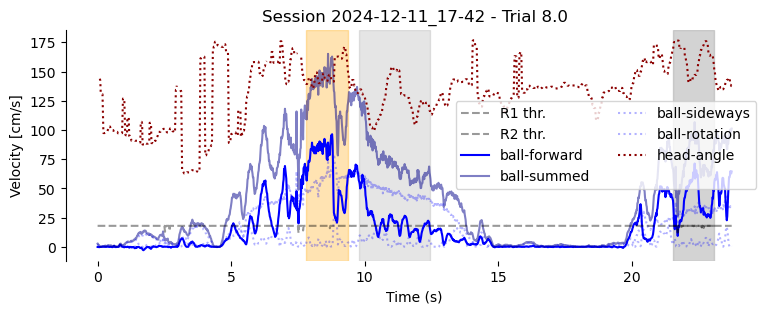

(819, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [11.01625 11.7829 ], in R1: False, in R2: True
  Diff to R2 thr: -0.08330000000000126


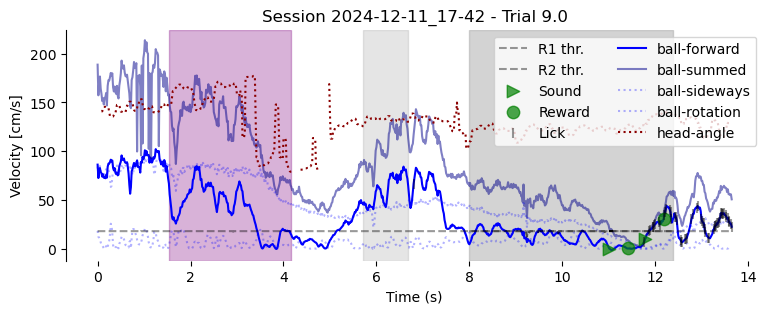

(832, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [11.48365 12.25045], in R1: False, in R2: True
  Diff to R2 thr: -0.03334999999999866


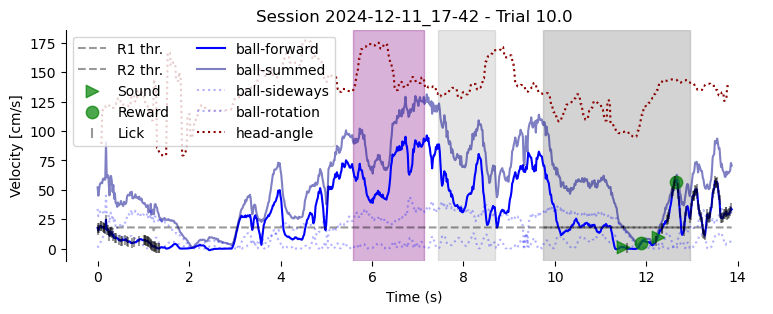

(1393, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [11.17115], in R1: True, in R2: False


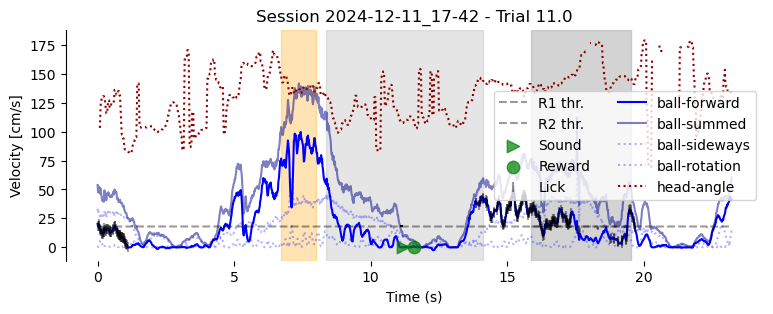

(1017, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [7.3997], in R1: False, in R2: False


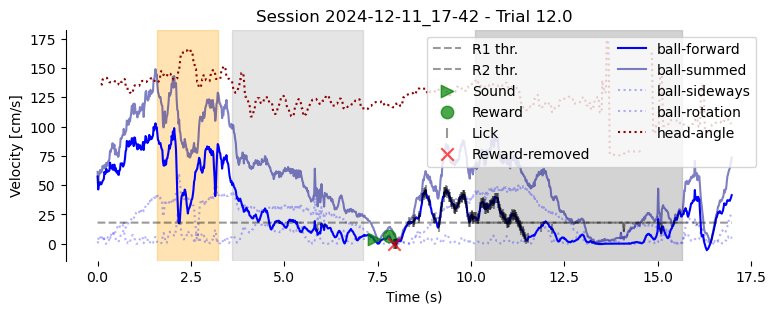

(1018, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [14.4098 15.1652], in R1: False, in R2: True
  Diff to R2 thr: -0.06744999999999912


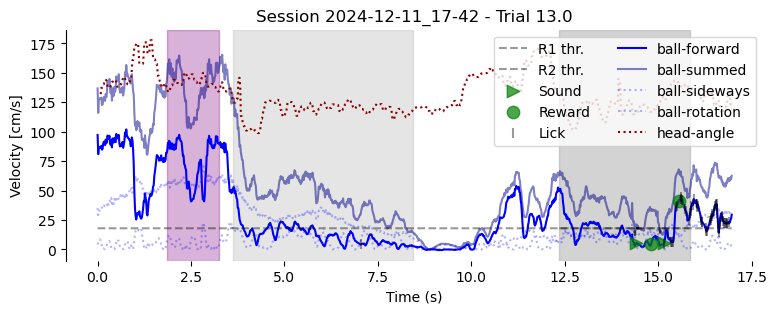

(3266, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [36.7012], in R1: True, in R2: False


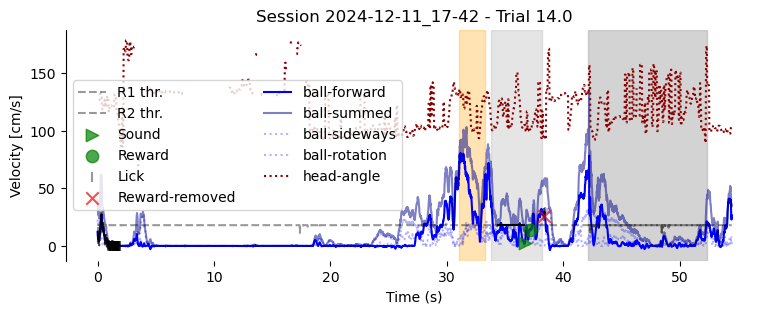

(1466, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



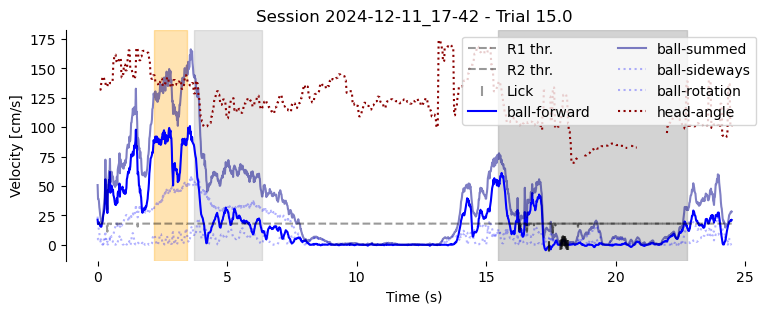

(700, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [5.1671], in R1: True, in R2: False


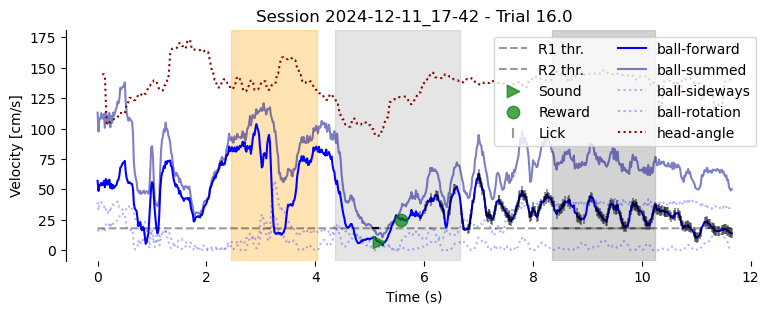

(1828, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



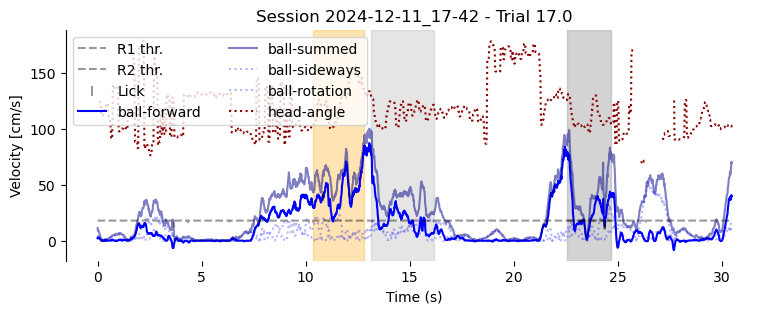

(983, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [4.6654], in R1: True, in R2: False


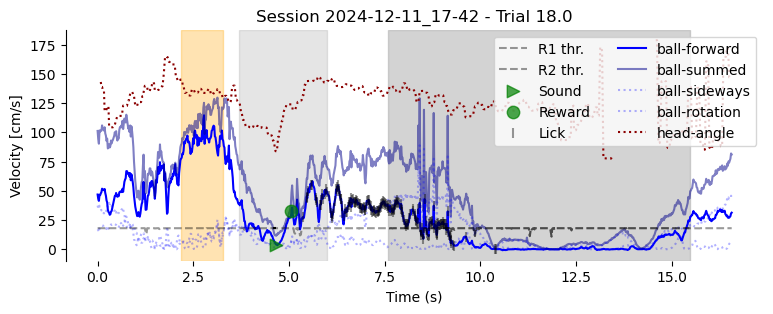

(799, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



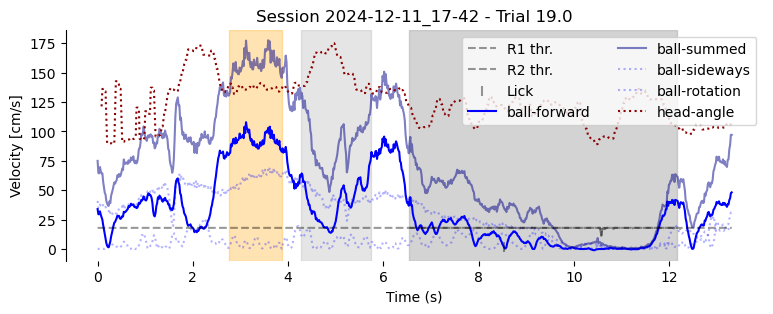

(555, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.81805], in R1: False, in R2: True
  Diff to R2 thr: -0.016649999999999388


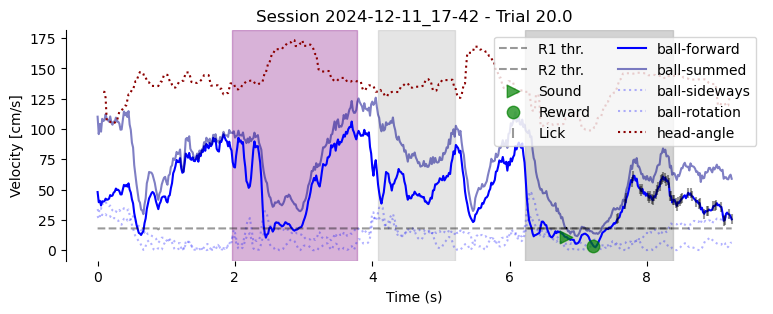

(1454, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [21.5326], in R1: False, in R2: True
  Diff to R2 thr: -0.1833500000000008


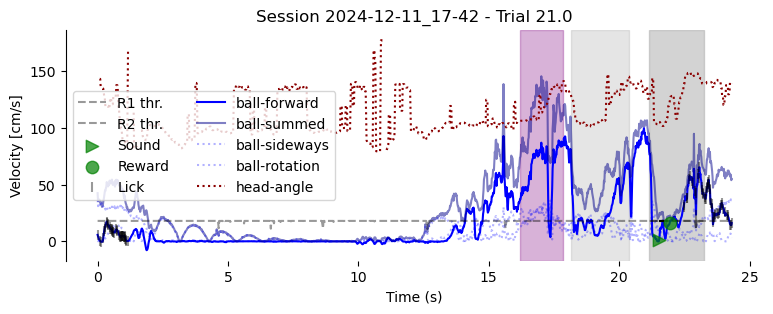

(729, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [8.0664  9.35045], in R1: False, in R2: True
  Diff to R2 thr: -0.05000000000000071


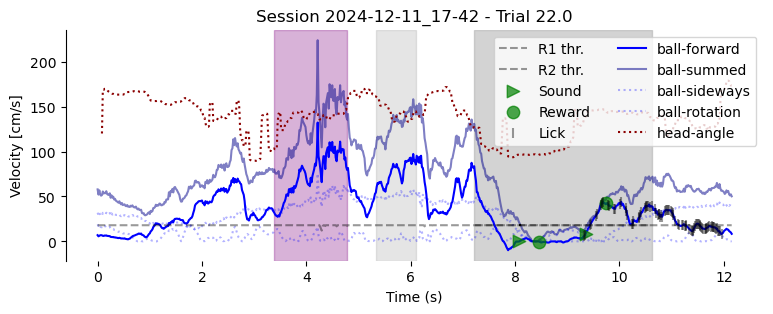

(961, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.41335], in R1: True, in R2: False


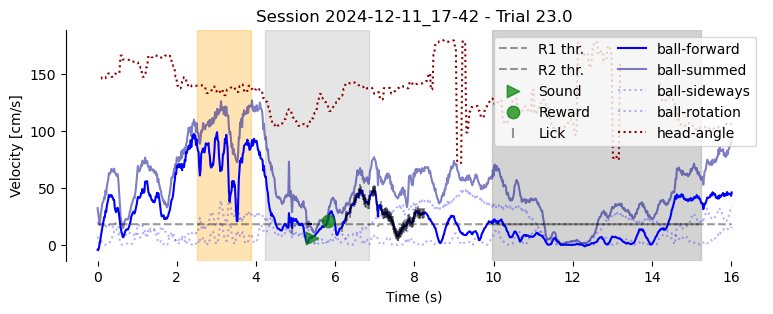

(588, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.8301], in R1: False, in R2: True
  Diff to R2 thr: 0.017249999999999766


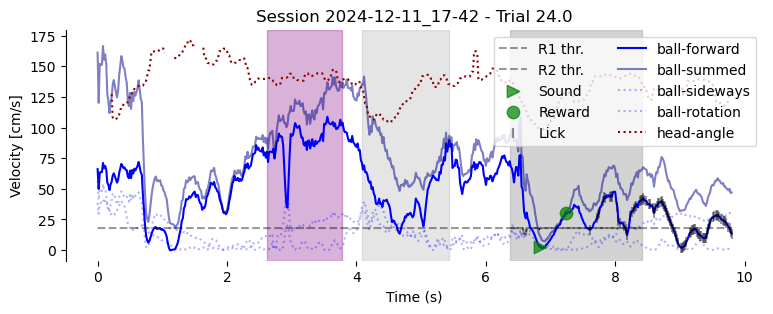

(970, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



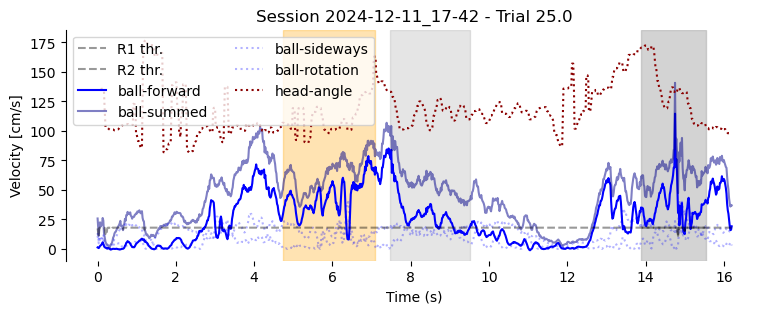

(979, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [6.7651], in R1: True, in R2: False


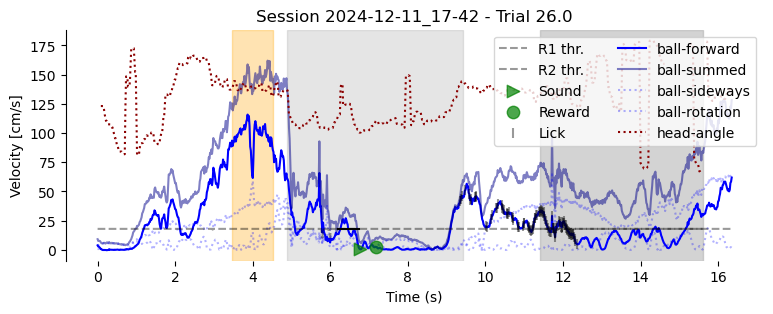

(575, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



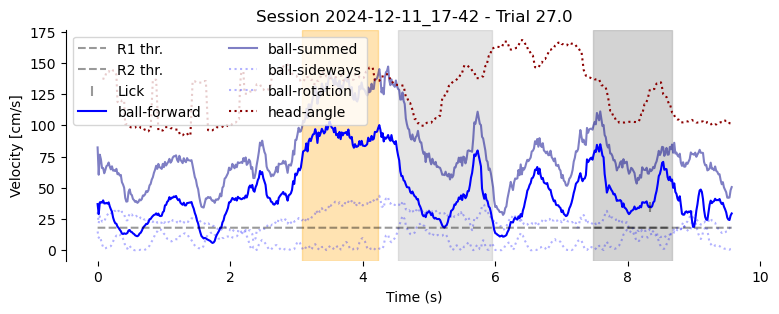

(727, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.684], in R1: False, in R2: True
  Diff to R2 thr: -0.1166999999999998


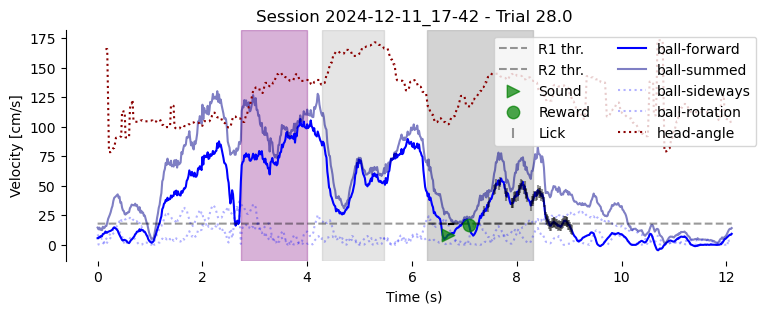

(1758, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [19.81205 21.9638 ], in R1: True, in R2: False


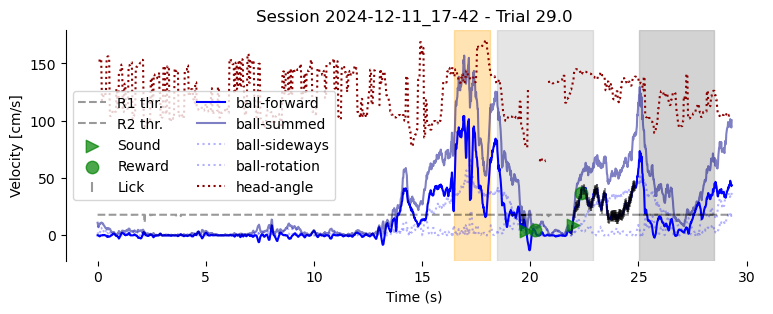

(913, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.7677 7.4844], in R1: True, in R2: False


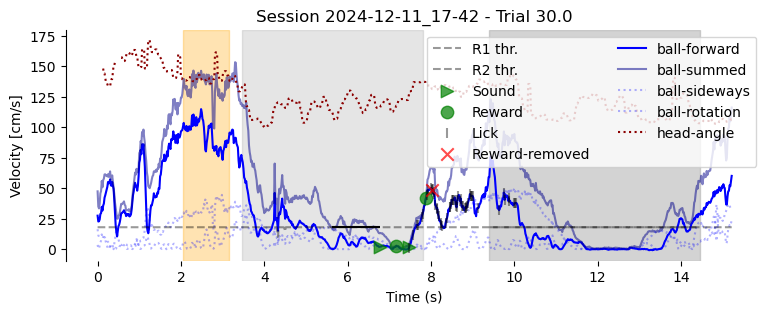

(748, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [10.06405 10.7975 ], in R1: False, in R2: True
  Diff to R2 thr: -0.016650000000000276


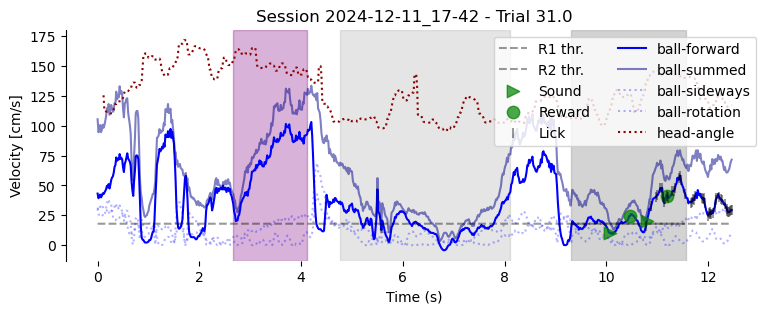

(1335, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



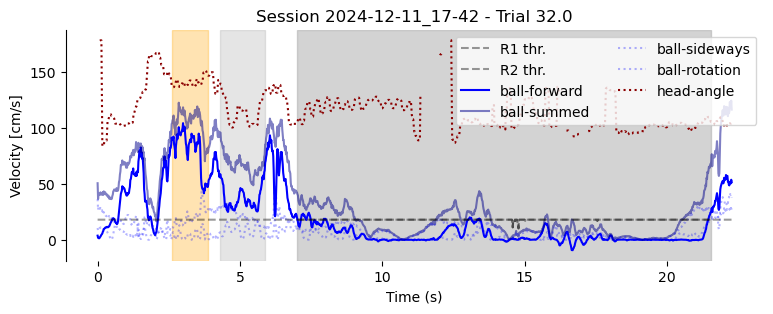

(708, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [9.08065 9.9476 ], in R1: False, in R2: True
  Diff to R2 thr: -0.09999999999999964


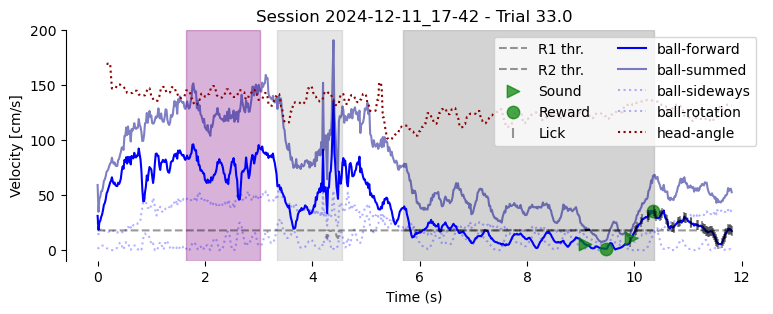

(1030, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [15.16445], in R1: False, in R2: True


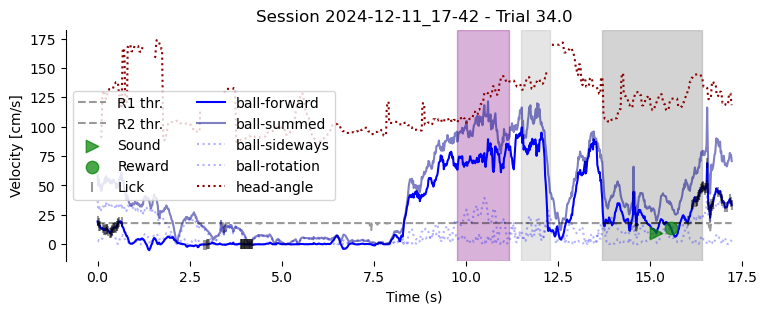

(1269, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



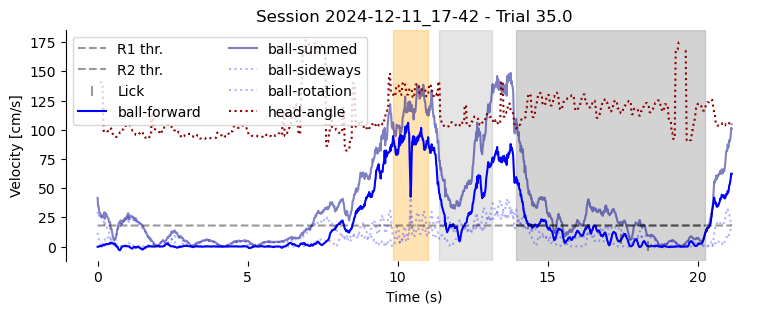

(986, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



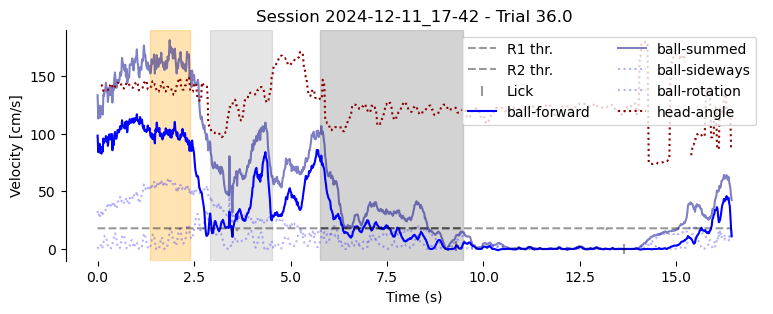

(507, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.034], in R1: False, in R2: True
  Diff to R2 thr: -0.06669999999999998


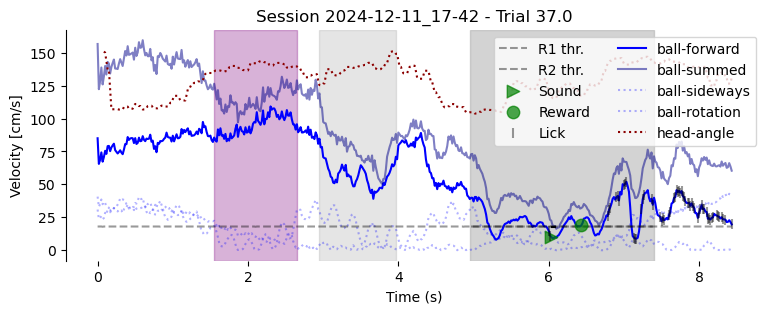

(1259, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.6001  8.05035], in R1: True, in R2: False


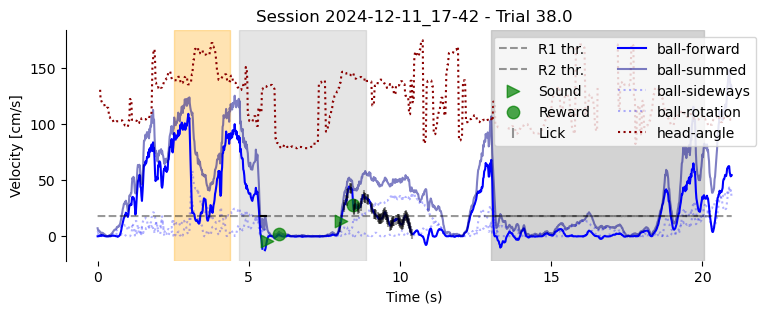

(700, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [4.14675], in R1: True, in R2: False


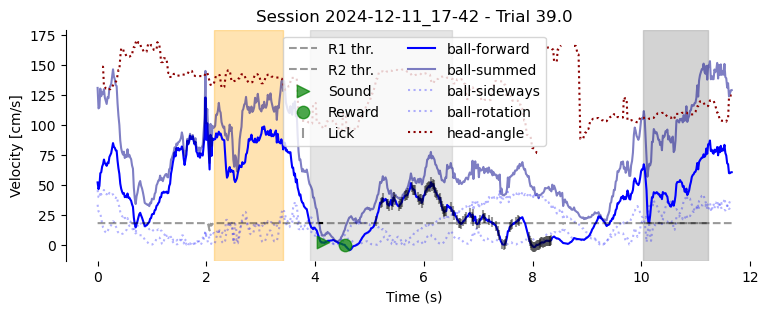

(590, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [8.68385], in R1: False, in R2: True
  Diff to R2 thr: -0.11664999999999992


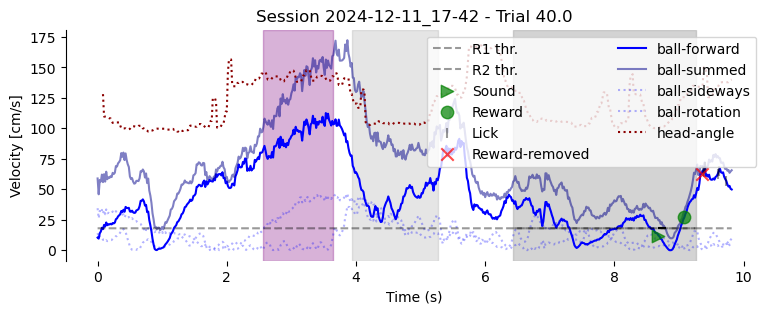

(934, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [7.4337], in R1: False, in R2: True
  Diff to R2 thr: -0.06669999999999998


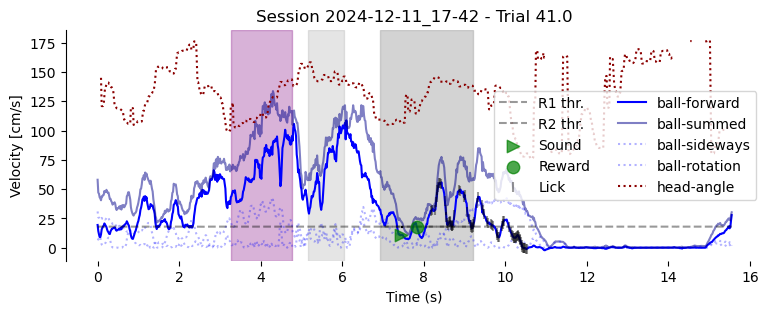

(849, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



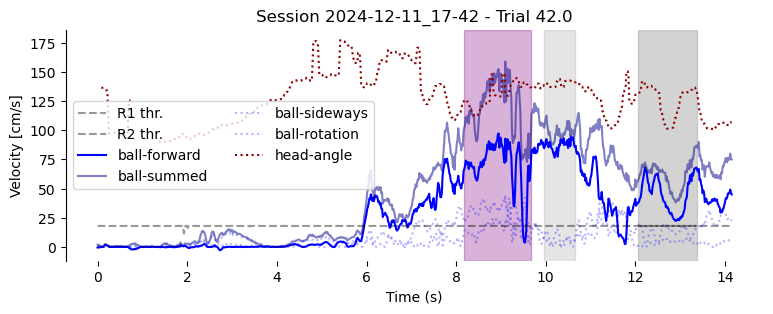

(631, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



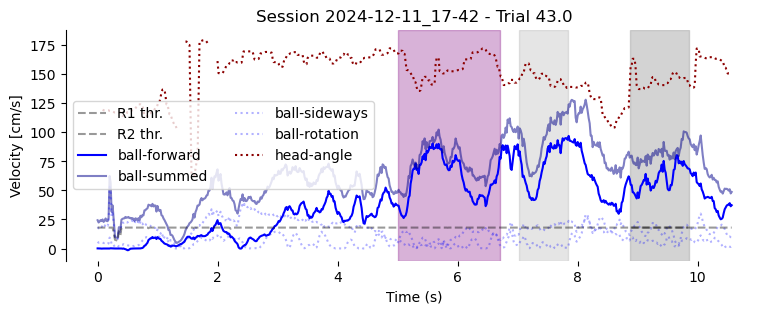

(564, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.10035 6.80045], in R1: False, in R2: True
  Diff to R2 thr: -0.3833500000000001


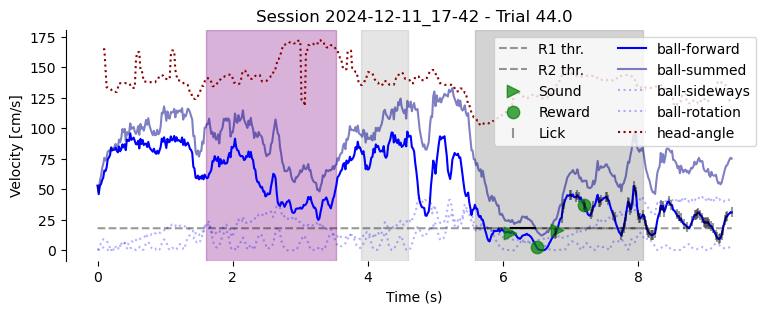

(815, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.5502  6.26685], in R1: True, in R2: False


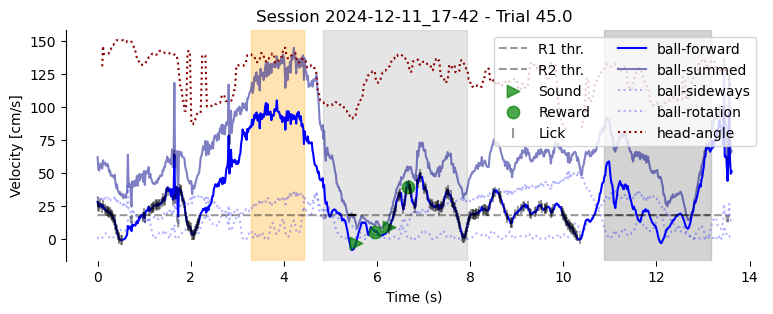

(1040, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [12.49865 13.56795], in R1: False, in R2: True
  Diff to R2 thr: 0.05105000000000004


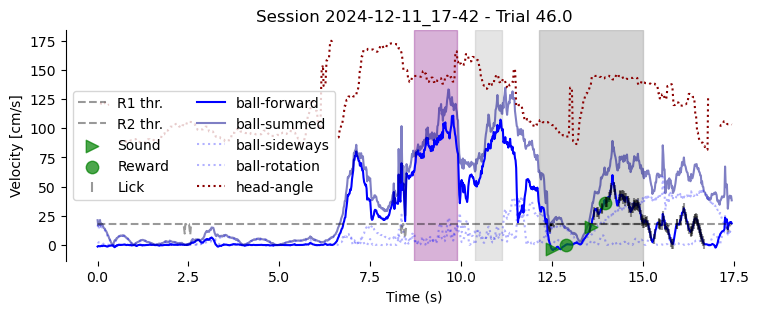

(715, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [3.51675], in R1: True, in R2: False


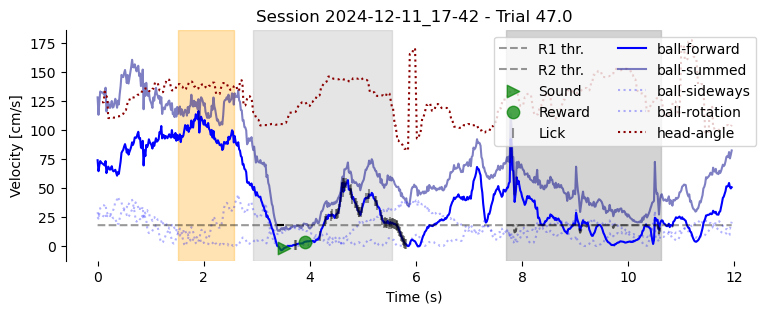

(803, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [3.8349], in R1: True, in R2: False


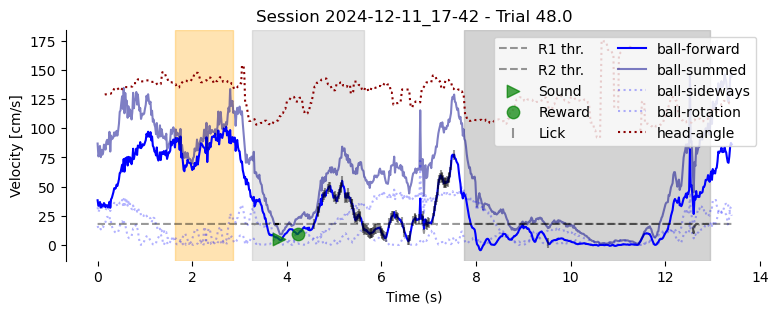

(589, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.45035 6.23375], in R1: False, in R2: True
  Diff to R2 thr: -0.03334999999999955


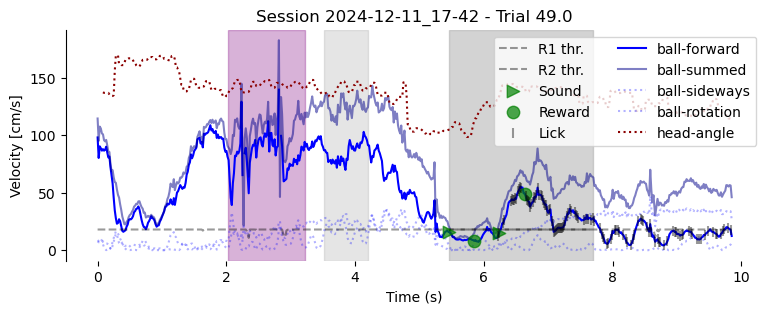

(1055, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [14.98615 15.9196 ], in R1: False, in R2: True
  Diff to R2 thr: 0.0


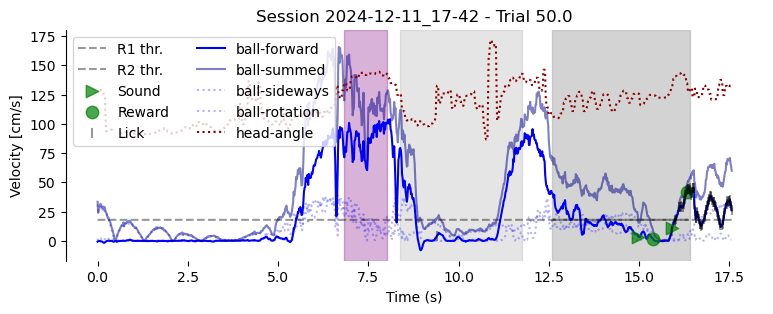

(762, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



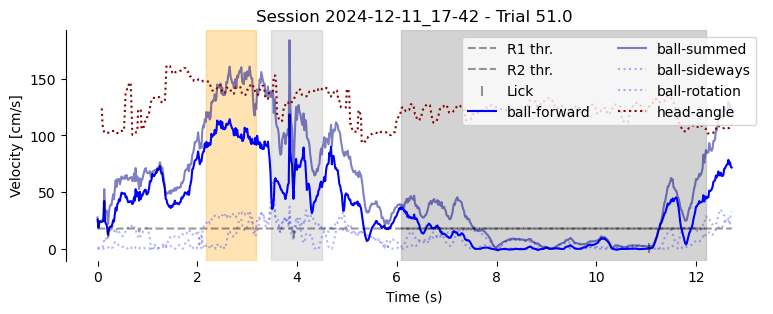

(467, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



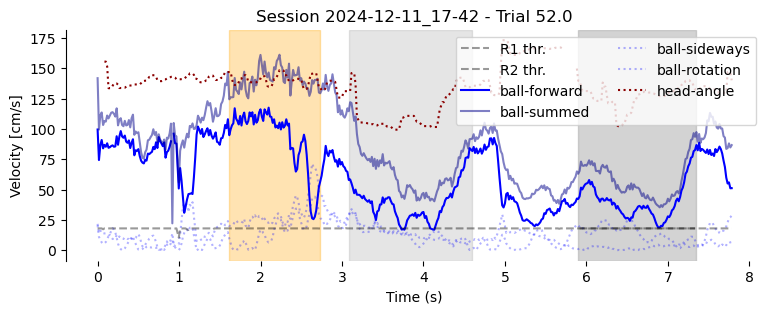

(555, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.9004], in R1: False, in R2: True
  Diff to R2 thr: -0.06669999999999998


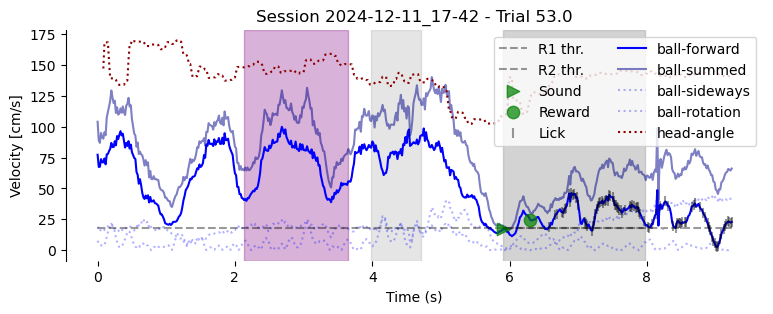

(757, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [7.10085 7.80085], in R1: False, in R2: True
  Diff to R2 thr: 0.0


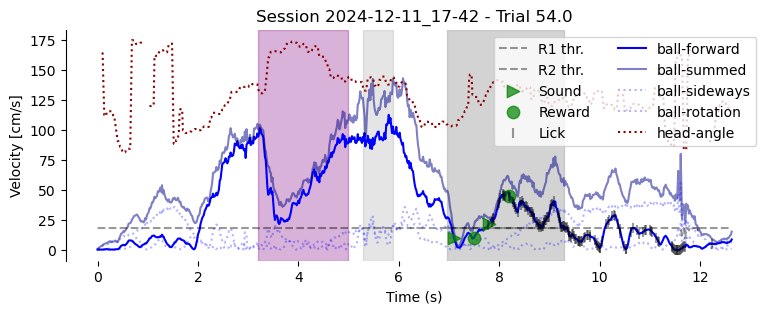

(614, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.7838], in R1: False, in R2: True
  Diff to R2 thr: 0.0


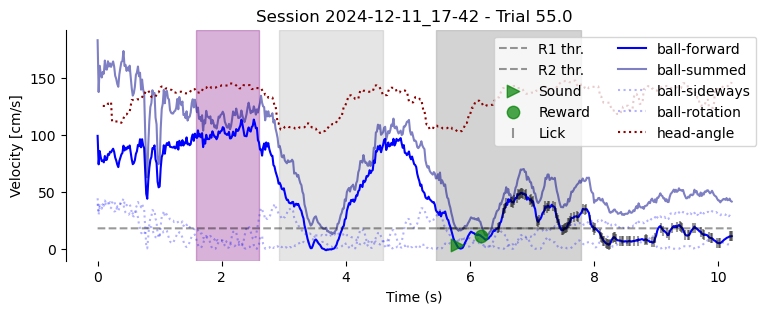

(768, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.9965  7.79655], in R1: False, in R2: True
  Diff to R2 thr: -0.11664999999999992


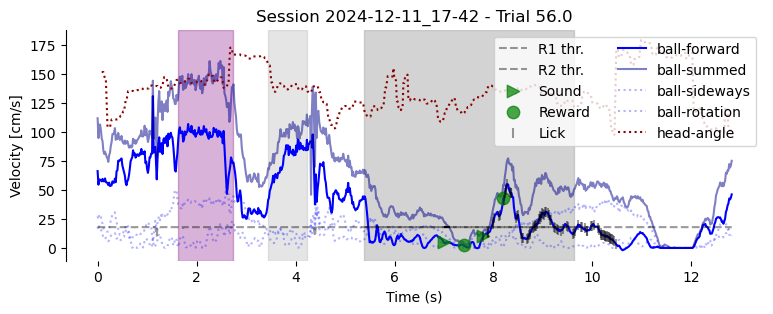

(730, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.58545 6.41885], in R1: False, in R2: True
  Diff to R2 thr: -0.04999999999999982


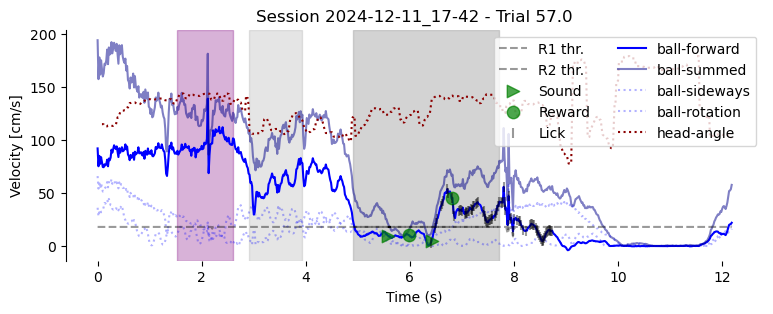

(563, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.06915 6.7692 ], in R1: False, in R2: True
  Diff to R2 thr: -0.05000000000000071


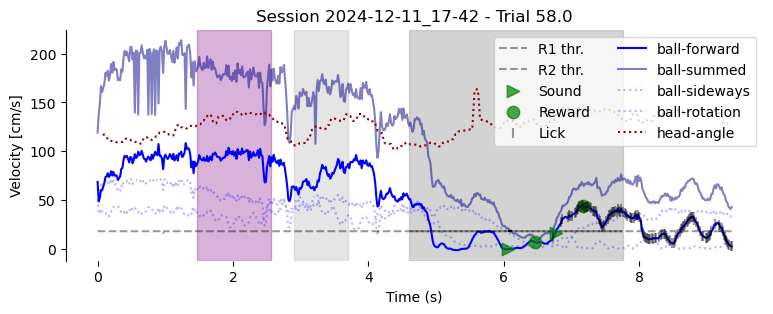

(910, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [12.2623], in R1: False, in R2: True
  Diff to R2 thr: -0.06665000000000099


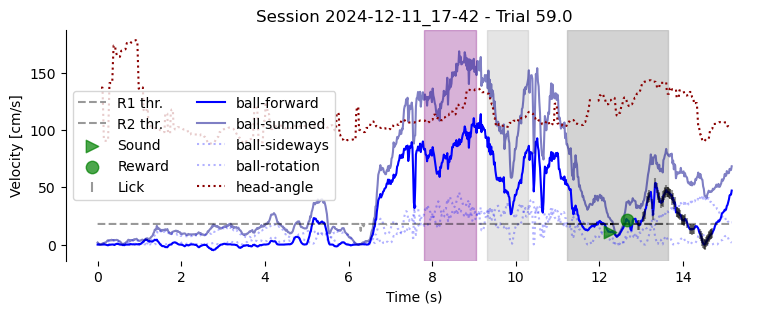

(732, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [9.052], in R1: False, in R2: True
  Diff to R2 thr: 0.016650000000000276


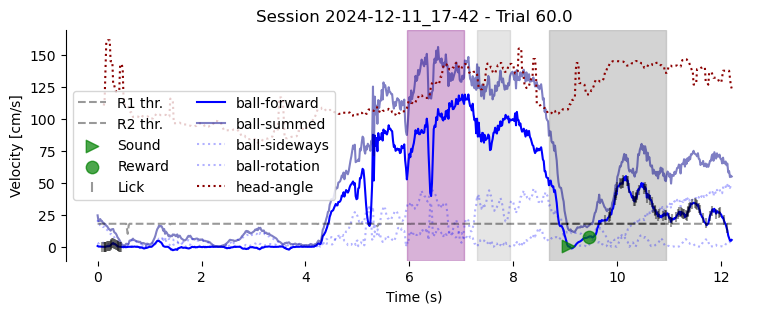

(616, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.68465], in R1: False, in R2: True
  Diff to R2 thr: 0.01670000000000016


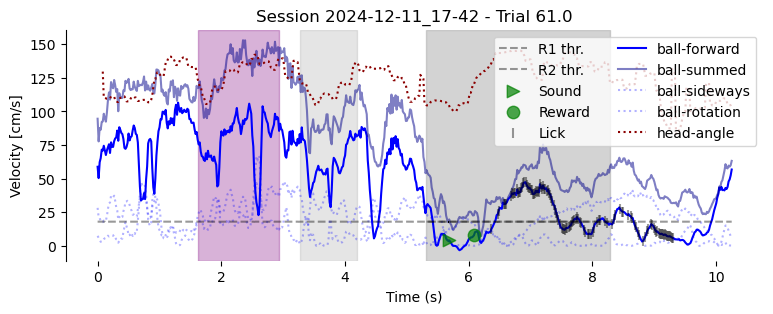

(683, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



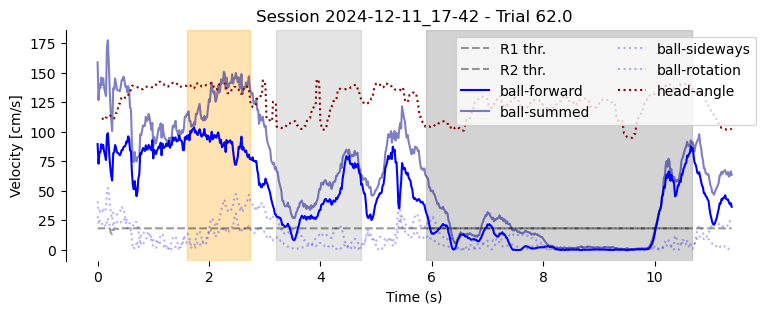

(675, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [3.75045], in R1: True, in R2: False


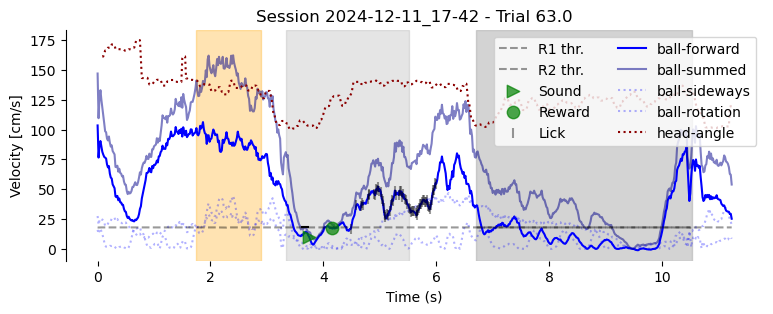

(730, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



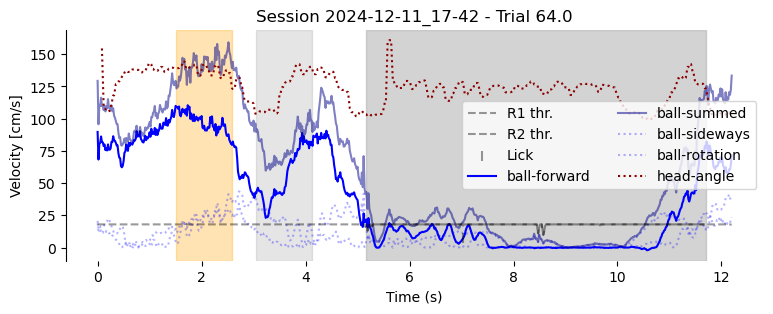

(461, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [4.3336], in R1: False, in R2: True
  Diff to R2 thr: -0.3501000000000003


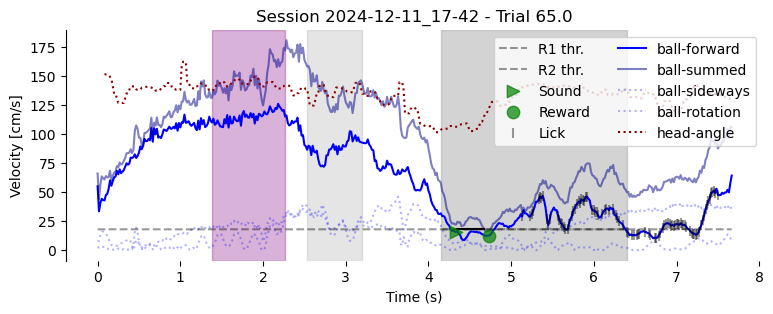

(748, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [8.6675], in R1: False, in R2: True
  Diff to R2 thr: 0.033350000000000435


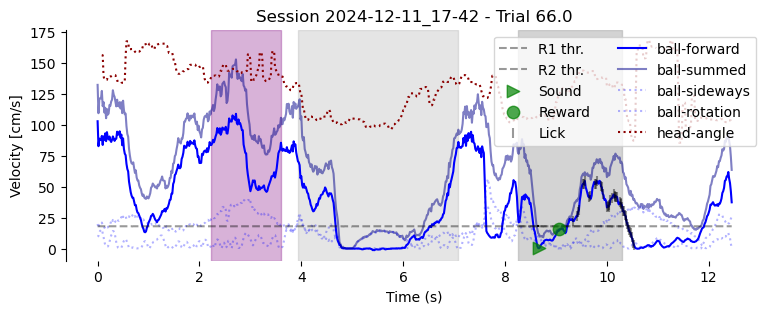

(780, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.7172], in R1: False, in R2: True
  Diff to R2 thr: 0.0


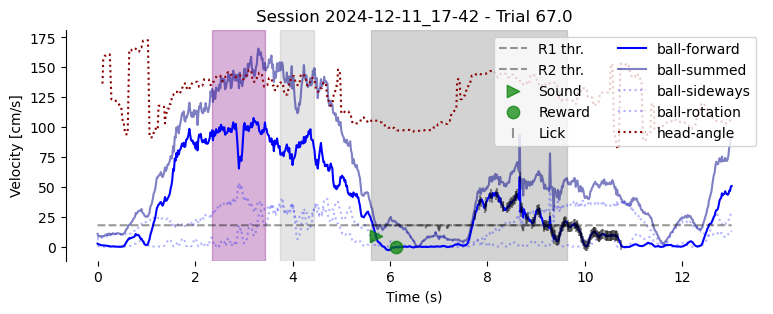

(617, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [4.56885 5.36895], in R1: False, in R2: True
  Diff to R2 thr: -0.4834499999999995


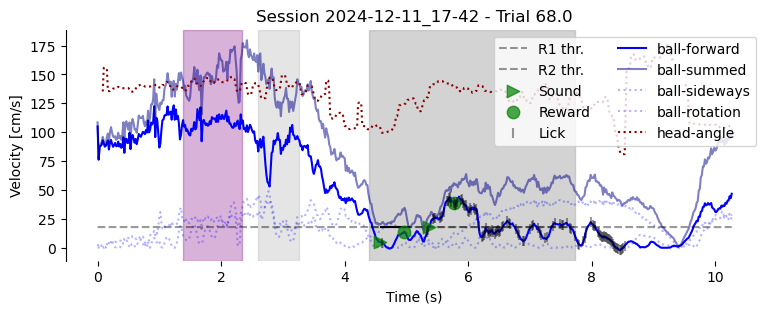

(412, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



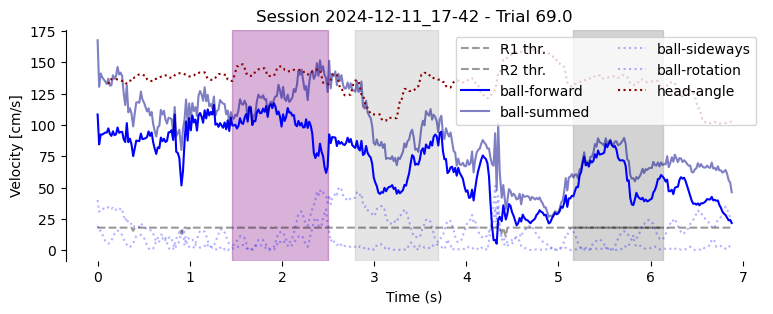

(600, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.73375], in R1: False, in R2: True
  Diff to R2 thr: -0.01670000000000016


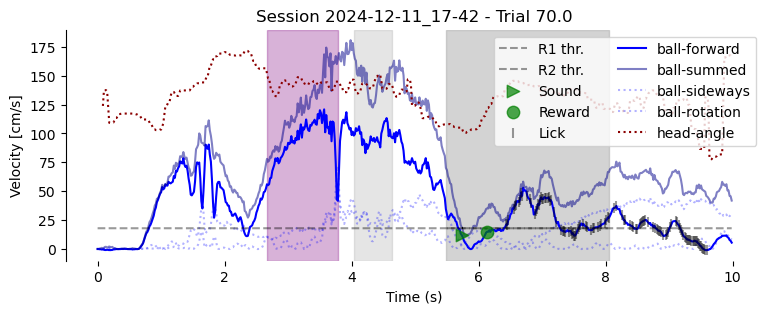

(618, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.50085 6.38415], in R1: False, in R2: True
  Diff to R2 thr: 0.0


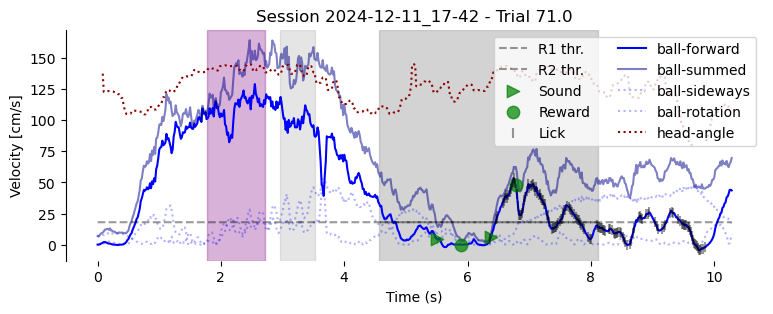

(699, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



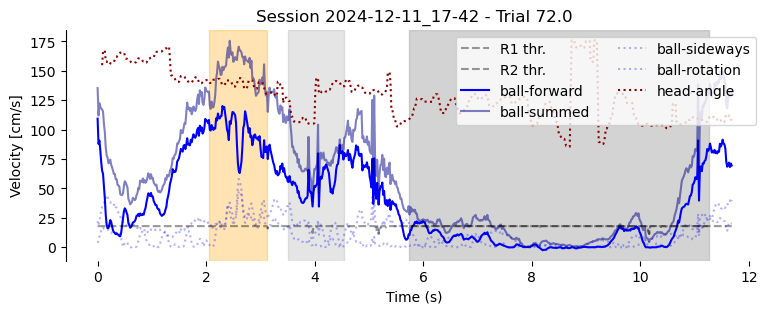

(1360, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



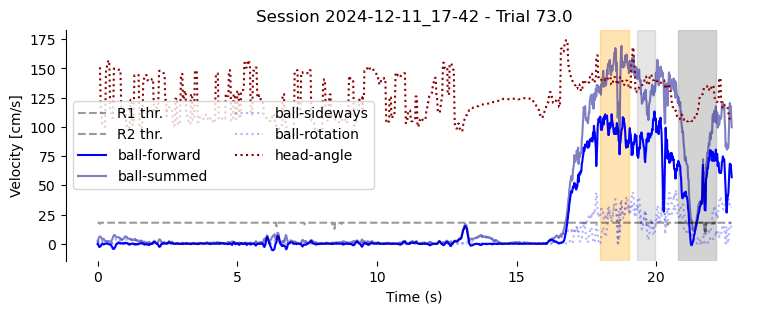

(1573, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.7834 6.6501 8.1171], in R1: True, in R2: False


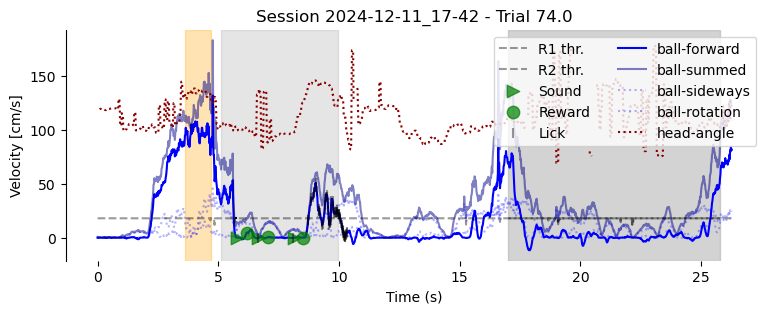

(499, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



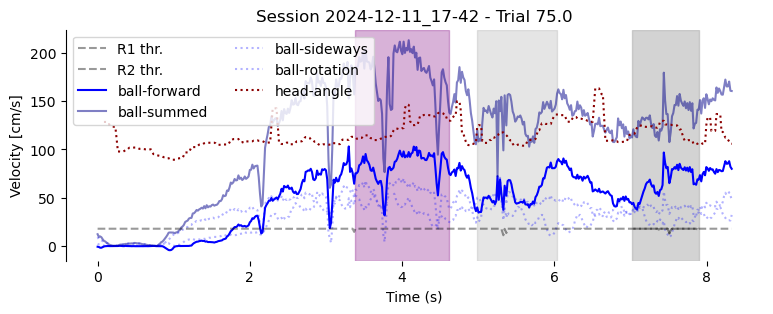

(606, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.88875 7.72255], in R1: False, in R2: True
  Diff to R2 thr: -0.03329999999999966


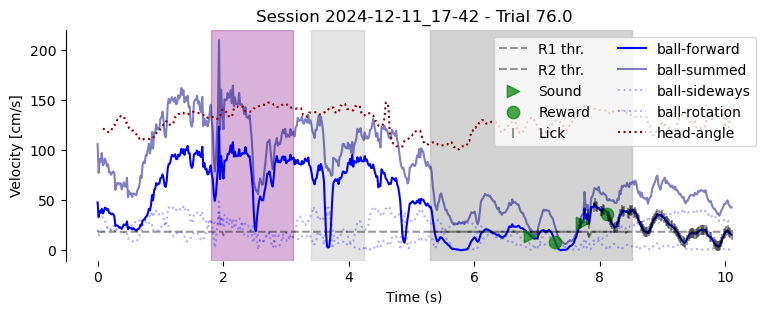

(828, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [ 9.8006 10.5851], in R1: False, in R2: True
  Diff to R2 thr: -0.11780000000000079


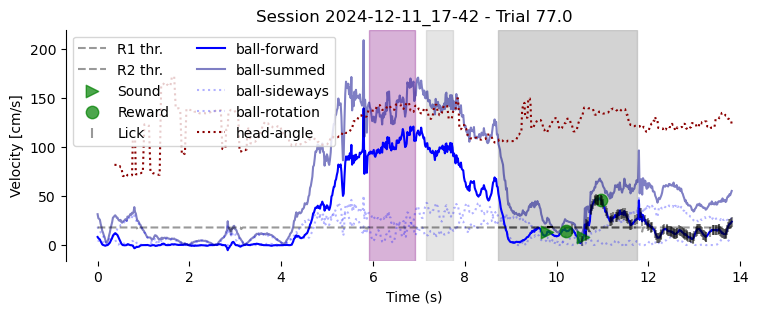

(447, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [4.5959], in R1: False, in R2: True
  Diff to R2 thr: -0.13335000000000008


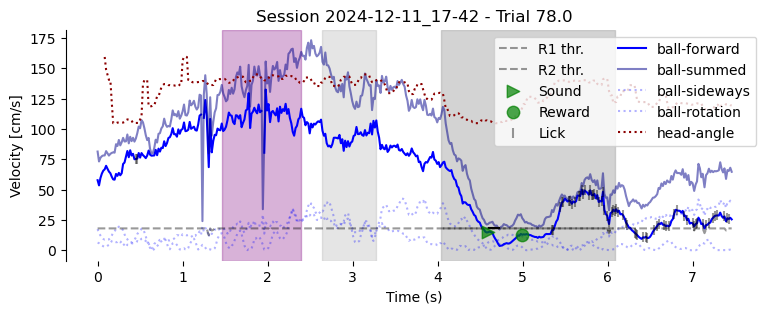

(541, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



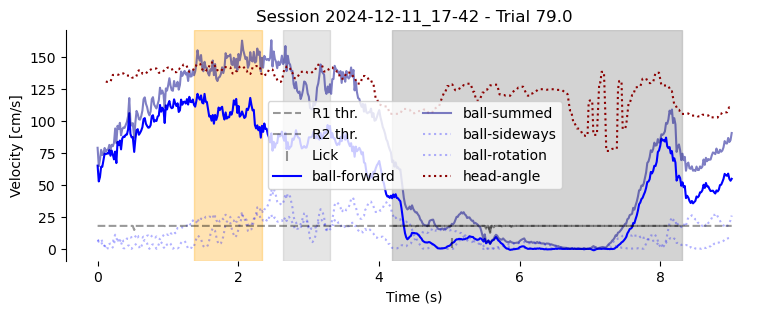

(564, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [4.81825 5.5516 ], in R1: False, in R2: True
  Diff to R2 thr: -0.050049999999999706


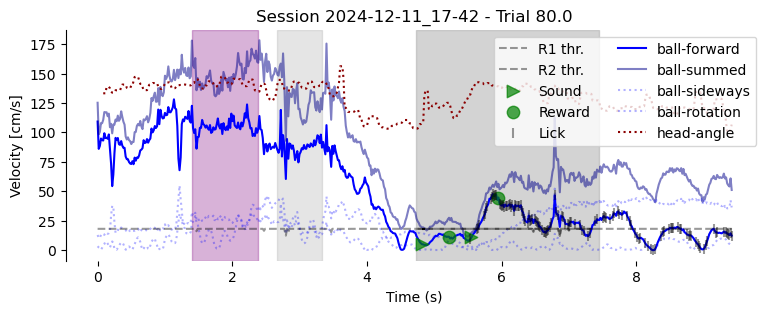

(647, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



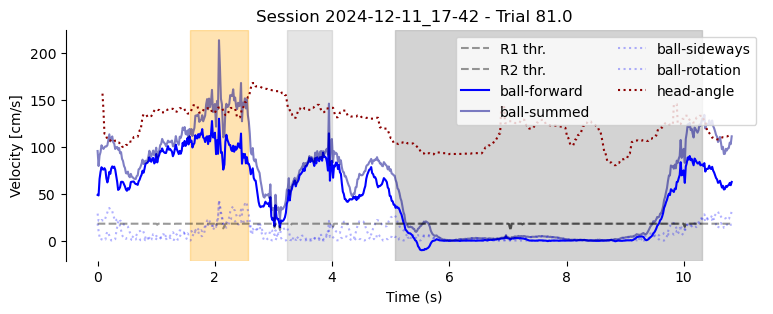

(1746, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [3.93295 5.52105 7.28785], in R1: True, in R2: False


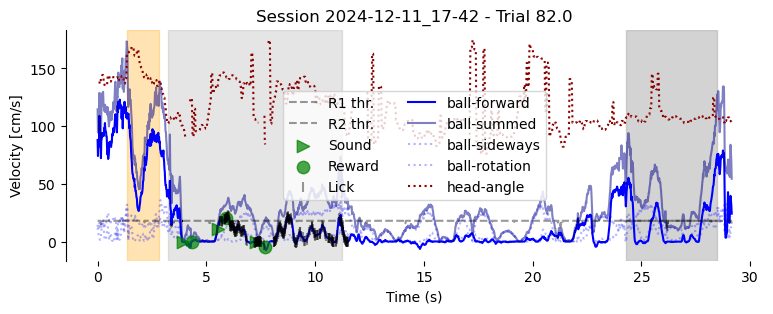

(1648, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [18.2848], in R1: True, in R2: False


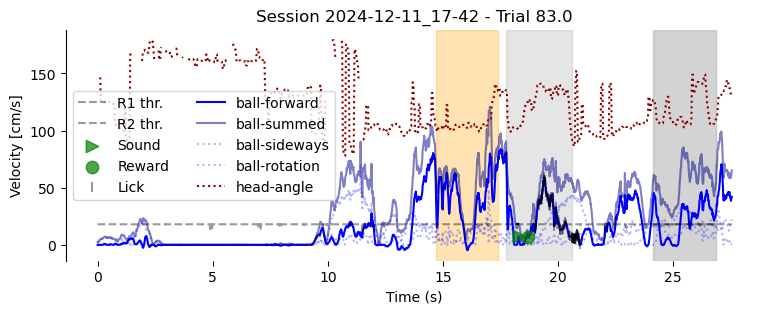

(821, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [10.09685 10.89685], in R1: False, in R2: True
  Diff to R2 thr: -0.6500000000000004


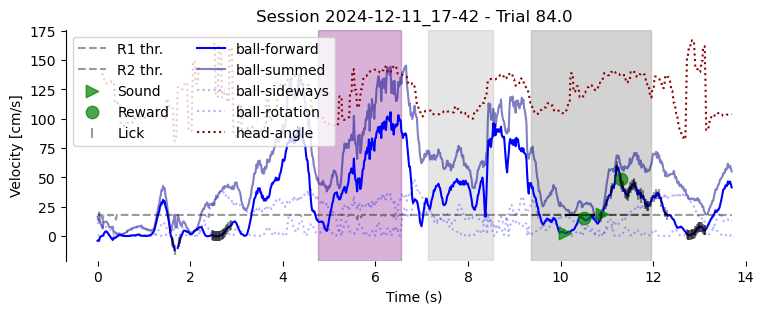

(559, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



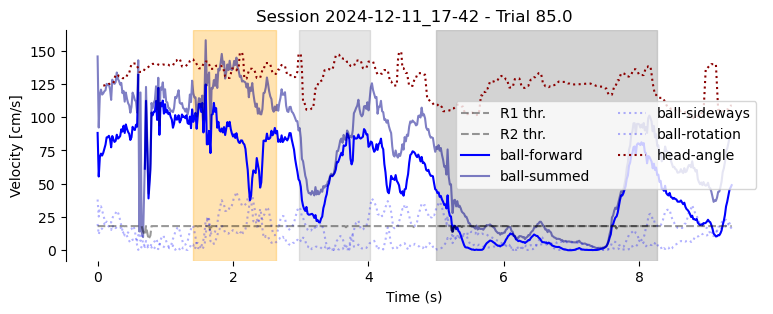

(672, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.8299  7.482   9.94935], in R1: False, in R2: True
  Diff to R2 thr: 0.0


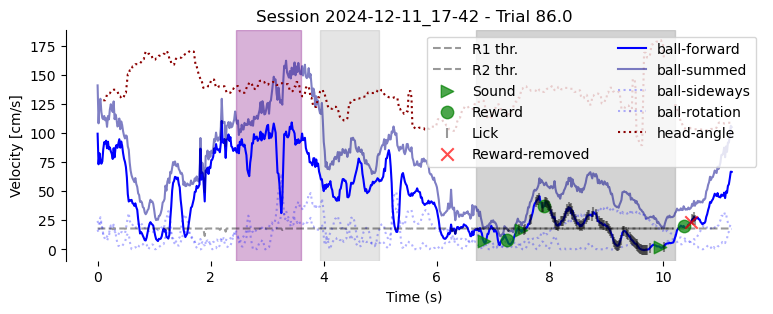

(570, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



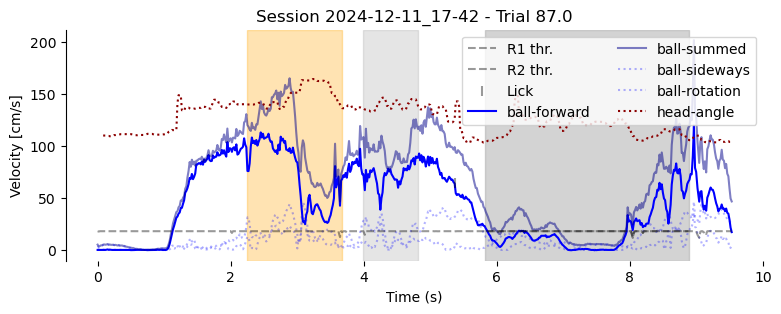

(661, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



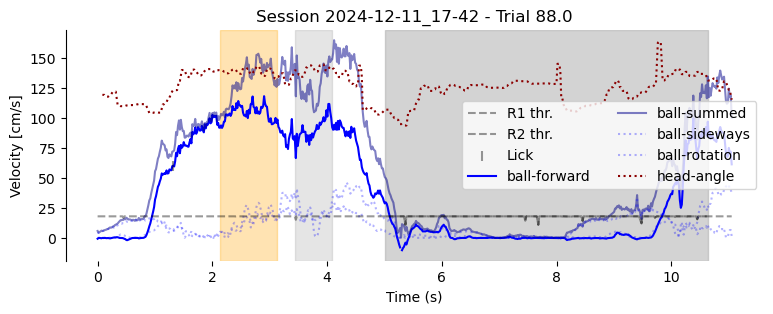

(558, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.13455 5.8847 ], in R1: False, in R2: True
  Diff to R2 thr: -0.0666500000000001


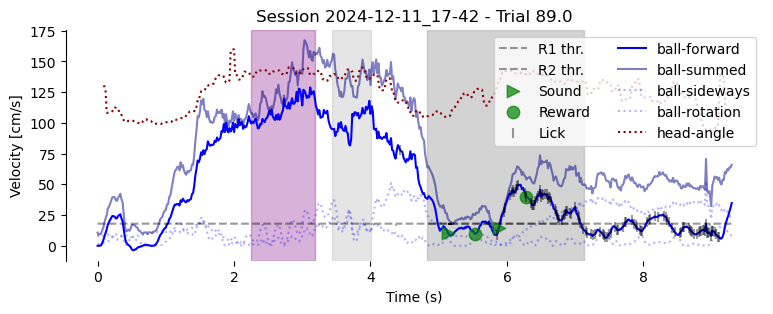

(531, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.5028 6.2542], in R1: False, in R2: True
  Diff to R2 thr: 0.0


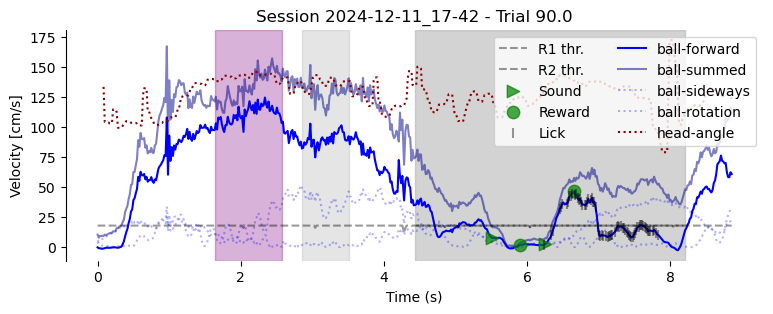

(662, 98)
choice_R1    1.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [4.3582  7.26375], in R1: True, in R2: False


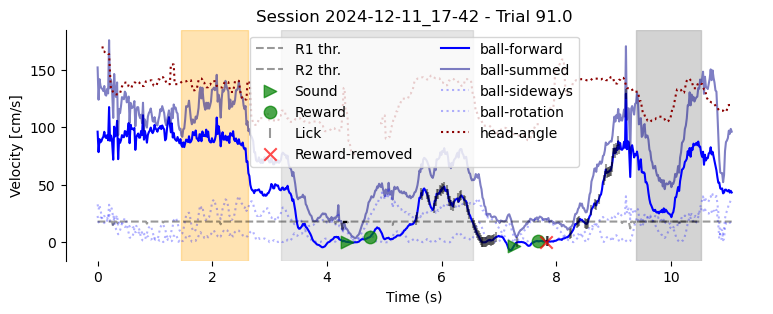

(627, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.4025 7.1692 9.6306], in R1: False, in R2: True
  Diff to R2 thr: -0.6667000000000005


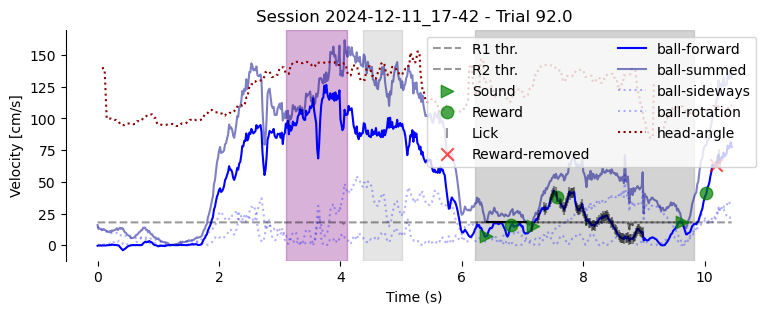

(380, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64



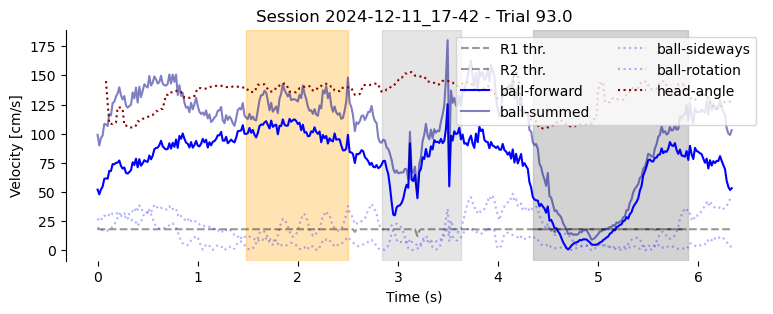

(483, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



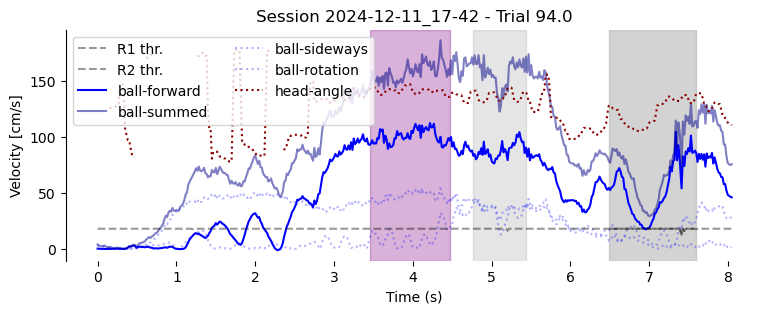

(612, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64



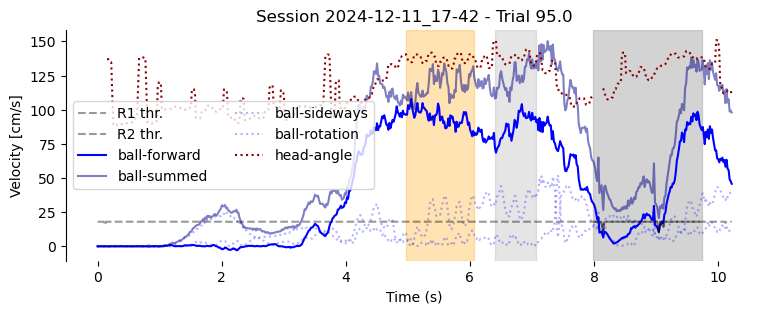

(646, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.2356  6.11905], in R1: False, in R2: True
  Diff to R2 thr: -0.45005000000000006


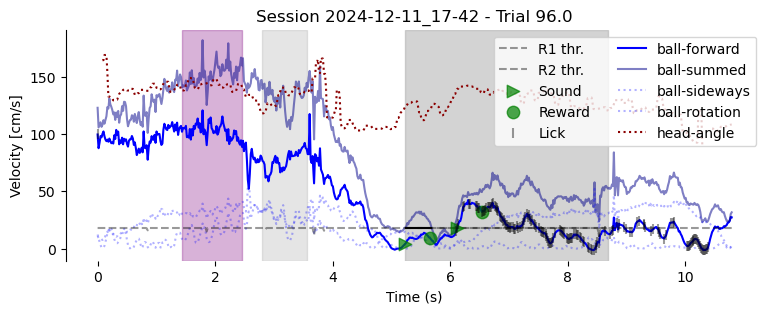

(559, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [6.03685 6.75365], in R1: False, in R2: True
  Diff to R2 thr: -0.016649999999999388


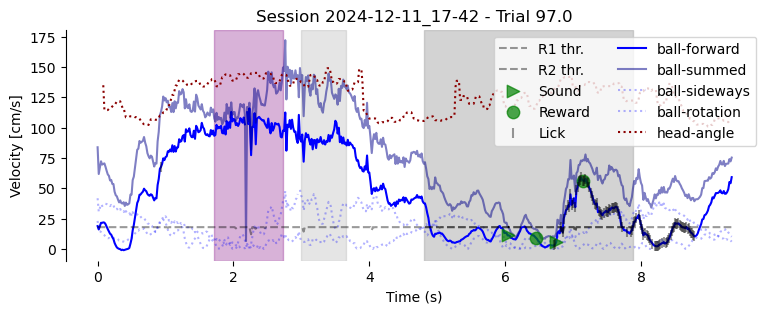

(745, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.547   6.29835 9.28265], in R1: False, in R2: True
  Diff to R2 thr: -0.0666500000000001


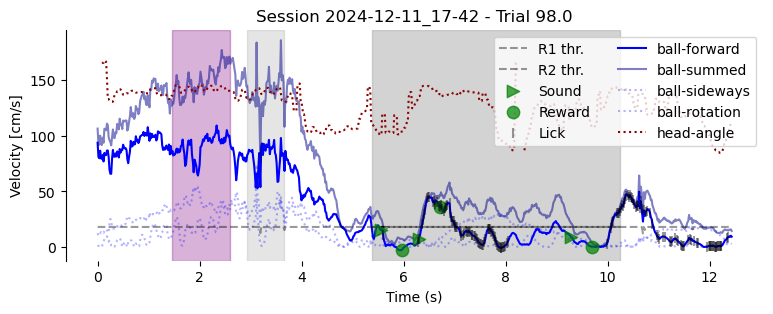

(638, 98)
choice_R1    0.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [5.6269  6.3637  8.16615], in R1: False, in R2: True
  Diff to R2 thr: -0.016650000000000276


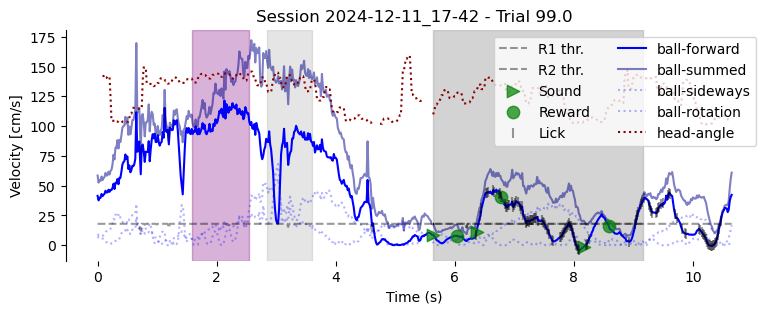

(717, 98)
choice_R1    1.0
choice_R2    1.0
Name: 0.0, dtype: float64

Sound event at [3.96455], in R1: True, in R2: False


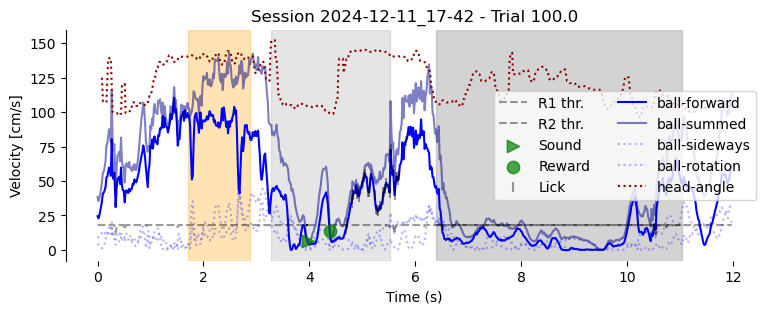

(841, 98)
choice_R1    0.0
choice_R2    0.0
Name: 0.0, dtype: float64

Sound event at [9.0691 9.8535], in R1: False, in R2: True


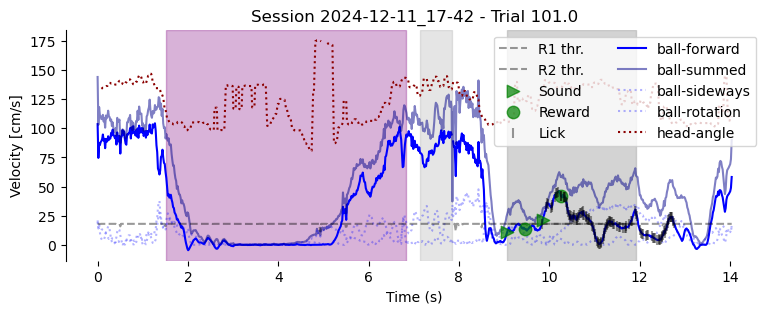

(array([ 2.,  0.,  1.,  1.,  1.,  1.,  0.,  1.,  6., 11., 19.,  8.,  7.,
         5.,  2.,  1.,  0.,  0.,  0.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([-0.6667  , -0.605362, -0.544024, -0.482686, -0.421348, -0.36001 ,
        -0.298672, -0.237334, -0.175996, -0.114658, -0.05332 ,  0.008018,
         0.069356,  0.130694,  0.192032,  0.25337 ,  0.314708,  0.376046,
         0.437384,  0.498722,  0.56006 ,  0.621398,  0.682736,  0.744074,
         0.805412,  0.86675 ,  0.928088,  0.989426,  1.050764,  1.112102,
         1.17344 ,  1.234778,  1.296116,  1.357454,  1.418792,  1.48013 ,
         1.541468,  1.602806,  1.664144,  1.725482,  1.78682 ,  1.848158,
         1.909496,  1.970834,  2.032172,  2.09351 ,  2.154848,  2.216186,
         2.277524,  2.338862,  2.4002  ]),
 <BarContainer object of 50 artists>)

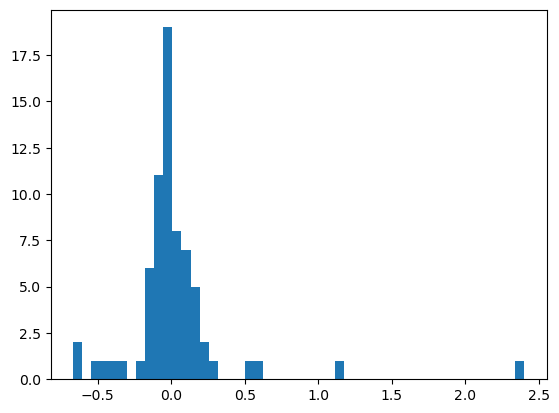

In [19]:

def plot_one_trial(trial_data, s_id, trial_id):
    plt.close('all')
    plt.figure(figsize=(9,3))

    # main_metric = 'frame_velocity'
    main_metric = 'frame_raw'
    # main_metric = 'frame_RawYawPitch_abs_velocity_sum'

    # which cue was shown
    color = 'orange' if trial_data['cue'].iloc[0] == 1 else 'purple'
    # if s_id < 8:
    #     color = 'white'

    # cue limits
    cue_entry_time = trial_data[(trial_data['frame_position'] >-80) & 
                                (trial_data['frame_position'] <25)].index.values
    plt.axvspan(cue_entry_time[0], cue_entry_time[-1], color=color, alpha=0.3)

    # R1 limits
    R1_entry_time = trial_data[trial_data['track_zone']=='reward1Zone'].index.values
    plt.axvspan(R1_entry_time[0], R1_entry_time[-1], color='grey', alpha=0.2)
    
    # R2 limits
    R2_entry_time = trial_data[trial_data['track_zone']=='reward2Zone'].index.values
    plt.axvspan(R2_entry_time[0], R2_entry_time[-1], color='darkgrey', alpha=0.5)


    r1_thr = (trial_data['velocity_threshold_at_R1'] * trial_data['fps'])

    r1_frames = r1_thr[(r1_thr.index>R1_entry_time[0]) & (r1_thr.index<R1_entry_time[-1])].index
    # plt.plot(r1_thr.loc[r1_frames], linestyle='--', color='black', 
    plt.plot(r1_thr, linestyle='--', color='black', 
             alpha=.4, label='R1 thr.')
    below_thr_r1 = trial_data.loc[r1_frames, 'frame_RawYawPitch_abs_velocity_sum'] <r1_thr.loc[r1_frames]
    # if below_thr_r1.any():
    #     plt.plot(trial_data.loc[r1_frames[below_thr_r1], 'frame_RawYawPitch_abs_velocity_sum'], color='green')
    
    
    r2_thr = (trial_data['velocity_threshold_at_R2'] * trial_data['fps'])
    r2_frames = r2_thr[(r2_thr.index>R2_entry_time[0]) & (r2_thr.index<R2_entry_time[-1])].index
    plt.plot(r2_thr.loc[r2_frames], linestyle='--', color='black', 
             alpha=.4, label='R2 thr.')
    below_thr_r2 = trial_data.loc[r2_frames, 'frame_RawYawPitch_abs_velocity_sum'] <r2_thr.loc[r2_frames]
    # if below_thr_r2.any():
    #     plt.plot(trial_data.loc[r2_frames[below_thr_r2], 'frame_RawYawPitch_abs_velocity_sum'], color='green')
    
    print()

    # events
    labels = {
        'reward-sound_count': {
            'label': f'Sound',
            'color': 'green',
            'size': 80,
            'alpha': 0.7,
            'marker': '>'},
        'reward-valve-open_count': {
            'label': 'Reward',
            'color': 'green',
            'size': 80,
            'alpha': 0.7,
            'marker': 'o'},
        'lick_count': {
            'label': 'Lick',
            'color': 'black',
            'size': 50,
            'alpha': 0.4,
            'marker': '|'},
        'reward-removed_count': {
            'label': 'Reward-removed',
            'color': 'red',
            'size': 80,
            'alpha': 0.7,
            'marker': 'x'}
    }
    for event in labels.keys():
        event_data = trial_data[trial_data[event] >= 1]
        
        if len(event_data) == 0:
            continue
        
        # only check first sound event
        if event == 'reward-sound_count':
            # first check which reward zone this happened
            in_r1 = (event_data.index[0] >= R1_entry_time[0]) & (event_data.index[0] <= R1_entry_time[-1])
            in_r2 = (event_data.index[0] >= R2_entry_time[0]) & (event_data.index[0] <= R2_entry_time[-1])
            print(f"Sound event at {event_data.index.values}, in R1: {in_r1.any()}, in R2: {in_r2.any()}")
            
            if in_r1 and r1_frames[below_thr_r1].any():
                diff_to_thr = event_data.index[0] - r1_frames[below_thr_r1].values[0]
                # plot line between them (horizontal)
                plt.hlines(y=r1_thr.loc[event_data.index.values[0]],
                           xmin=r1_frames[below_thr_r1].values[0],
                           xmax=event_data.index[0],
                           color='black', )
                all_diffs.append(diff_to_thr)
            
            if in_r2 and r2_frames[below_thr_r2].any():
                diff_to_thr = event_data.index[0] - r2_frames[below_thr_r2].values[0]
                # plot line between them (horizontal)
                plt.hlines(y=r2_thr.loc[event_data.index.values[0]],
                           xmin=r2_frames[below_thr_r2].values[0],
                           xmax=event_data.index[0],
                           color='black', )
                print(f"  Diff to R2 thr: {diff_to_thr}")
                all_diffs.append(diff_to_thr)
                
            
        plt.scatter(
            event_data.index,
            event_data[main_metric],
            color=labels[event]['color'],
            s=labels[event]['size'],
            marker=labels[event]['marker'],
            label=f'{labels[event]["label"]}',
            alpha=labels[event]['alpha'],
            zorder=5  # Ensure markers appear on top
        )

    # main metric to draw
    plt.plot(trial_data[main_metric], zorder=1, color='blue', label='ball-forward')
    # others
    plt.plot(trial_data['frame_RawYawPitch_abs_velocity_sum'], zorder=1, color='darkblue', alpha=0.5, linestyle='-', label='ball-summed')
    plt.plot(trial_data['frame_pitch'].abs(), zorder=1, color='blue', alpha=0.3, linestyle=':', label='ball-sideways')
    plt.plot(trial_data['frame_yaw'].abs(), zorder=1, color='blue', alpha=0.3, linestyle=':', label='ball-rotation')

    plt.plot(trial_data['facecam_pose_nose_neck_body1_angle'].rolling(6).median(), zorder=1, color='darkred',  linestyle=':', label='head-angle')

    # plt.ylim(-10,30)
    # plt.xlim(0,5)

    plt.xlabel('Time (s)')
    plt.ylabel('Velocity [cm/s]')
    plt.title(f'Session {s_id} - Trial {trial_id}')
    plt.legend(ncol=2)

    # remove top spines
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)

    plt.show()

all_diffs = []
# s_id = 17
for trial_id in framew_beh.xs(s_id, level='session_id')['trial_id'].unique():
    if trial_id == -1:
        continue
    trial_data = framew_beh.xs(s_id, level='session_id').loc[framew_beh.xs(s_id, level='session_id')['trial_id'] == trial_id]
    print(trial_data.shape)
    trial_data = trial_data.set_index(time_col, drop=True, append=False)
    trial_data.index = (trial_data.index - trial_data.index[0]) /1e6
    print(trial_data[['choice_R1', 'choice_R2']].iloc[0])
    plot_one_trial(trial_data, s_id, trial_id)
    # break
plt.show()
plt.hist(all_diffs, bins=50)